# Modeling MBSA dataset using Neural Network 

这个教程将详细展示如何使用神经网络模型对小鼠大脑矢状面前部数据集(mouse brain sagittal anterior)建模，包含具体的调参过程。

## 目录
* [数据预处理](#数据预处理)
  1. [读取数据](#读取数据)
* [制作数据集](#制作数据集)
  1. [标签与特征](#标签与特征)
  2. [划分数据集](#划分数据集)
* [模型比较](#模型比较)
* [模型评估](#模型评估)

## 数据预处理 <a class="anchor" id="数据预处理"></a>

首先，导入相关的库

In [1]:
import os
os.chdir("..")
import scanpy as sc
import numpy as np
import gc
import pickle
import pandas as pd

from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

# 导入自己编写的库
from datapre import DataProcess as DP
from datapre import Sample as SP
from model import nn_model
import evaluation as eval

sc.set_figure_params(facecolor = "white")
sc.settings.verbosity = 3
dirname = "mouse_brain_cell2location"

d:\anaconda3\envs\scanpy\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


设置默认的距离阈值为1.0

In [2]:
NEIGHBOR_DIS = 1.0

### 读取数据

标记线粒体基因，使用FeaturePlot函数可视化。

reading data\ST8059048\filtered_feature_bc_matrix.h5
 (0:00:00)


d:\anaconda3\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


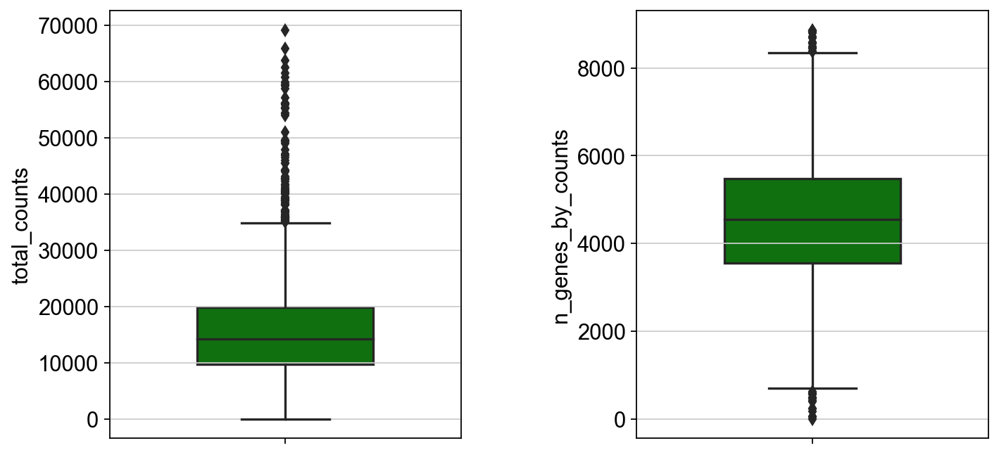

In [3]:
adata = sc.read_visium("data/ST8059048/")
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars = ["mt"], inplace = True)
DP.FeaturePlot(adata)

In [4]:
adata_region = pd.read_csv("data/20200904_regionAnnotation_per_location.csv", index_col=0)
adata_region = adata_region[adata_region.index.str.startswith("ST8059048")]
adata_region = adata_region["region_label"]
adata_region = pd.Series(adata_region.values, adata_region.index.str.replace("ST8059048_", "", 1), "category")
adata.obs["clusters"] = adata_region[adata.obs_names]

过滤总表达量小于10的基因

In [5]:
sc.pp.filter_genes(adata, min_counts = 10)

filtered out 13924 genes that are detected in less than 10 counts


## 制作数据集

全局设置随机数种子

In [6]:
DP.setup_seed(38)

### 标签与特征

生成数据集标签

In [7]:
label_total, distance  = DP.CreateLabel(adata, neighbor_dis = NEIGHBOR_DIS)

运行SpaGene，识别空间可变基因

In [8]:
DP.adata2seurat(adata, "ST8059048")
! Rscript spagene.R ST8059048 1000
spagene = DP.find_Spa("data/ST8059048/spagene.txt")

Loading required package: ggplot2
Loading required package: patchwork


进行归一化、对数化、标准化

In [9]:
adata = DP.data_final(adata, spagene = spagene)
count = adata.to_df().values

normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


### 划分数据集

选择所有正样本，并按照1:2的比例抽取负样本

In [10]:
sample_index = SP.sample_data_index(label_total, neg_size = 2)
label, feature = SP.index2data(label_total, sample_index, count)

划分训练集和测试集

In [11]:
train_feature, train_label, test_feature, test_label = SP.split_dataset(label, feature)

train_feature = train_feature[:, 2:]
test_index = test_feature[:, [0,1]].astype("int32")
test_feature = test_feature[:, 2:]

## 模型比较

神经网络模型

第0轮，训练损失：0.3661
第0轮，验证损失：0.2595
Validation loss decreased (inf --> 0.259463).  Saving model ...
第1轮，训练损失：0.2586
第1轮，验证损失：0.2266
Validation loss decreased (0.259463 --> 0.226618).  Saving model ...
第2轮，训练损失：0.2222
第2轮，验证损失：0.2118
Validation loss decreased (0.226618 --> 0.211766).  Saving model ...
第3轮，训练损失：0.2034
第3轮，验证损失：0.2035
Validation loss decreased (0.211766 --> 0.203530).  Saving model ...
第4轮，训练损失：0.1841
第4轮，验证损失：0.2024
Validation loss decreased (0.203530 --> 0.202429).  Saving model ...
第5轮，训练损失：0.1808
第5轮，验证损失：0.1974
Validation loss decreased (0.202429 --> 0.197369).  Saving model ...
第6轮，训练损失：0.1704
第6轮，验证损失：0.1897
Validation loss decreased (0.197369 --> 0.189650).  Saving model ...
第7轮，训练损失：0.1615
第7轮，验证损失：0.1979
EarlyStopping counter: 1 out of 7
第8轮，训练损失：0.1585
第8轮，验证损失：0.1997
EarlyStopping counter: 2 out of 7
第9轮，训练损失：0.1530
第9轮，验证损失：0.2002
EarlyStopping counter: 3 out of 7
第10轮，训练损失：0.1457
第10轮，验证损失：0.1975
EarlyStopping counter: 4 out of 7
第11轮，训练损失：0.1431
第11轮，验证损失：0.183

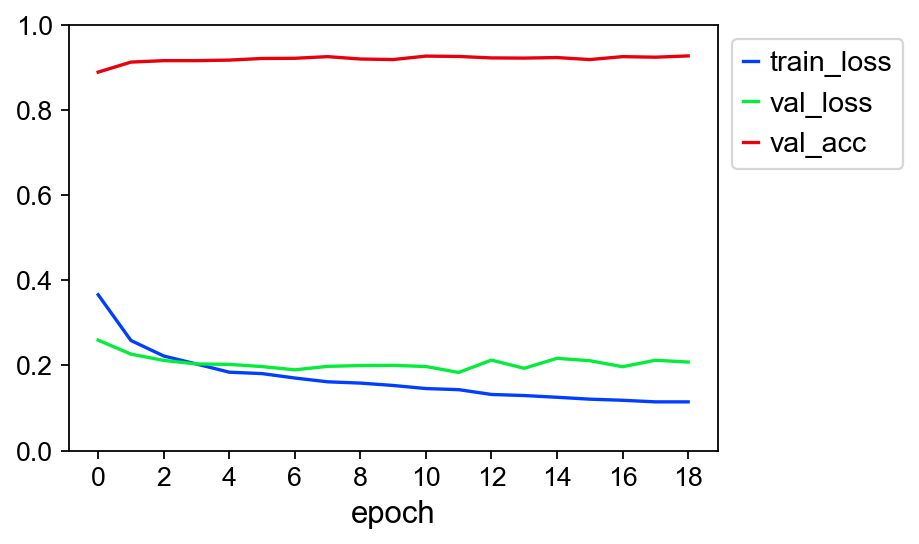

In [12]:
nnmodel = nn_model.NeuralNetworkClassifier(
    num_features = 375, 
    batch_size = 32,
    hidden_layer_sizes = [200, 50],
    dropout_rate = 0.5,
    figname = dirname + "/NN_epoch"
)
nnmodel.fit(train_feature, train_label)
pred_nn = nnmodel.predict(test_feature)
predprob_nn = nnmodel.predict_proba(test_feature)
result_nn = eval.evaluate(test_label, pred_nn, predprob_nn, verbose = False)

xgboost 模型

In [13]:
start = int(train_feature.shape[1] / 2)
X = np.concatenate(
    (train_feature[:, :175], train_feature[:, start:(start + 175)]),
    1
)
test_X = np.concatenate(
    (test_feature[:, :175], test_feature[:, start:(start + 175)]),
    1
)

In [14]:
xgbmodel = XGBClassifier(
    learning_rate = 0.05,
    n_estimators = 647,
    max_depth = 6,
    min_child_weight = 2,
    gamma = 1,
    colsample_bytree = 0.9,
    subsample = 0.9,
    objective = "binary:logistic"
)
xgbmodel.fit(X, train_label)
pred_xgb = xgbmodel.predict(test_X)
predprob_xgb = xgbmodel.predict_proba(test_X)
result_xgb = eval.evaluate(test_label, pred_xgb, predprob_xgb, verbose = False)

Random Forest 模型

In [15]:
start = int(train_feature.shape[1] / 2)
X = np.concatenate(
    (train_feature[:, :150], train_feature[:, start:(start + 150)]),
    1
)
test_X = np.concatenate(
    (test_feature[:, :150], test_feature[:, start:(start + 150)]),
    1
)

In [16]:
rfmodel = RandomForestClassifier(n_estimators = 280)
rfmodel.fit(X, train_label)
pred_rf = rfmodel.predict(test_X)
predprob_rf = rfmodel.predict_proba(test_X)
result_rf = eval.evaluate(test_label, pred_rf, predprob_rf, verbose = False)

根据少数特征构建xgboost模型

In [17]:
with open(dirname + "/selected_index.pkl", 'rb') as file:
    selected = pickle.load(file)

In [18]:
start = int(train_feature.shape[1] / 2)
train_feature_sel = np.concatenate(
    (train_feature[:, selected], train_feature[:, start + selected]),
    1
)
test_feature_sel = np.concatenate(
    (test_feature[:, selected], test_feature[:, start + selected]),
    1
)

In [19]:
selected_model = XGBClassifier(learning_rate = 0.05, n_estimators = 1000)
selected_model.fit(train_feature_sel, train_label)
pred_sel = selected_model.predict(test_feature_sel)
predprob_sel = selected_model.predict_proba(test_feature_sel)
result_sel = eval.evaluate(test_label, pred_sel, predprob_sel, verbose = False)

In [20]:
eval.model_compare(nnmodel = result_nn, xgbmodel = result_xgb, rfmodel = result_rf, selmodel = result_sel)

,Accuracy,Precision,Recall,MCC,F_Score,AUC,Average Precision
nnmodel,0.929,0.848,0.960,0.849,0.900,0.973,0.922
xgbmodel,0.921,0.834,0.954,0.834,0.890,0.966,0.906
rfmodel,0.881,0.818,0.827,0.733,0.822,0.945,0.856
selmodel,0.904,0.816,0.921,0.795,0.865,0.959,0.888


## 模型评估

误判样本可视化

In [21]:
result_nn

{'Accuracy': 0.9291217257318952,
 'Precision': 0.8478038815117467,
 'Recall': 0.9595375722543352,
 'MCC': 0.8494803412774303,
 'F_Score': 0.9002169197396963,
 'AUC': 0.9732775000584379,
 'Average Precision': 0.9224969569608599,
 'confusion_matrix': array([[1582,  149],
        [  35,  830]], dtype=int64)}

C:\Users\我只是来搞笑的\AppData\Roaming\Python\Python39\site-packages\scanpy-1.9.1-py3.9.egg\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
C:\Users\我只是来搞笑的\AppData\Roaming\Python\Python39\site-packages\scanpy-1.9.1-py3.9.egg\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


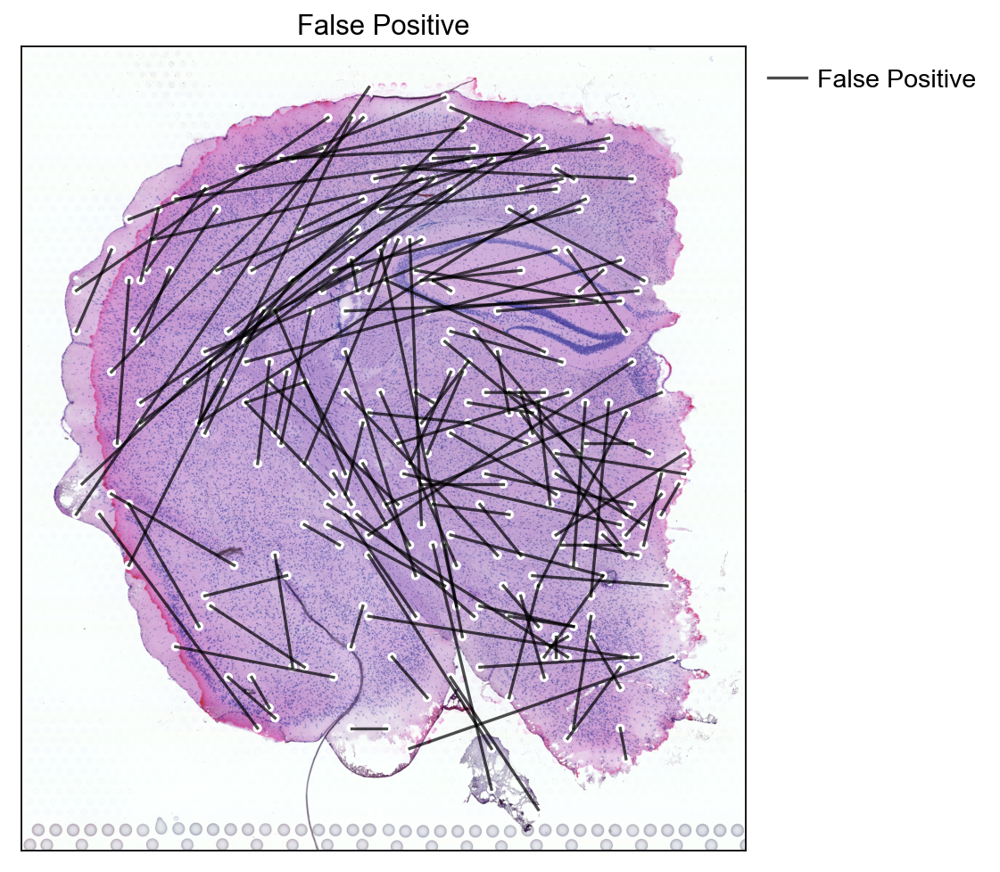

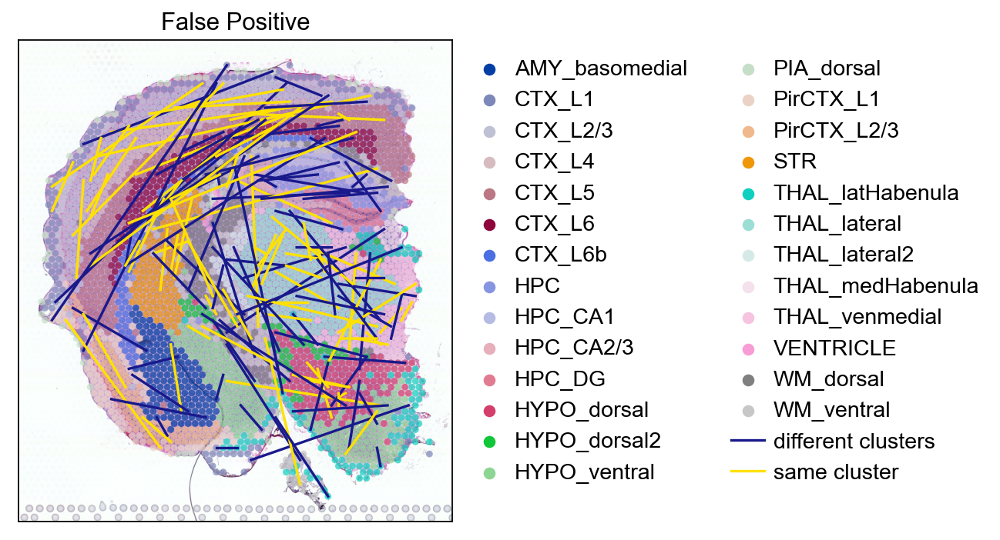

假正例中属于相同簇的点对占比为：49.7%


C:\Users\我只是来搞笑的\AppData\Roaming\Python\Python39\site-packages\scanpy-1.9.1-py3.9.egg\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
C:\Users\我只是来搞笑的\AppData\Roaming\Python\Python39\site-packages\scanpy-1.9.1-py3.9.egg\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


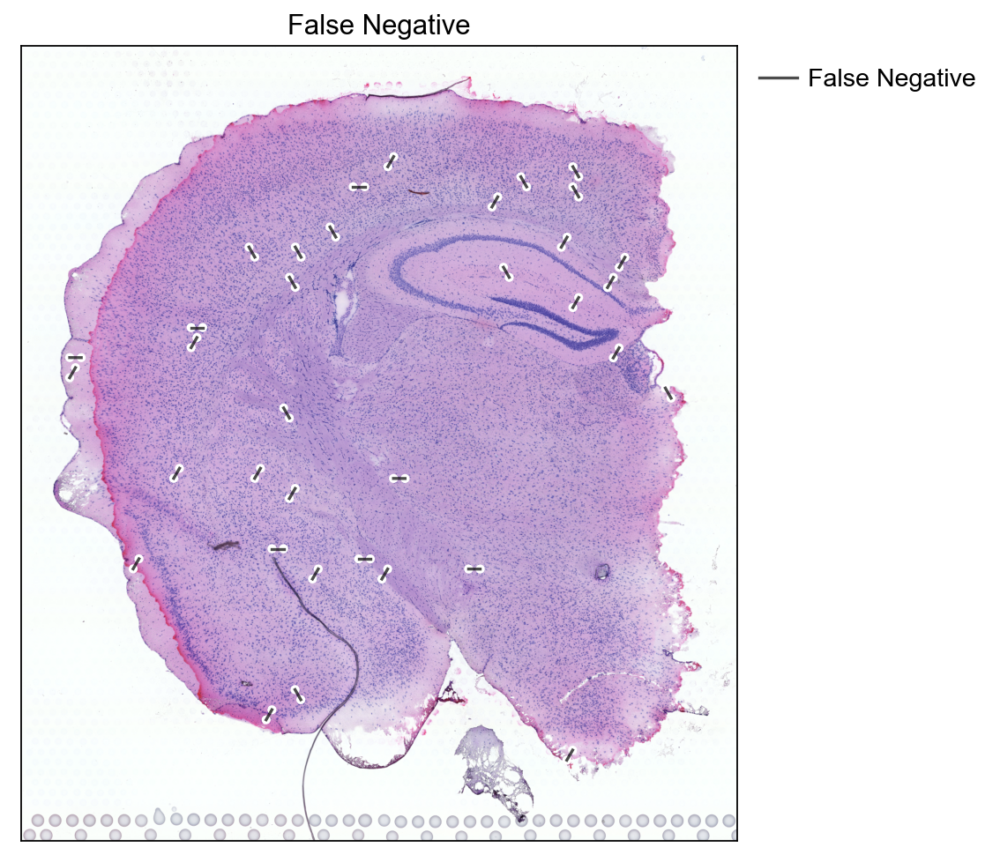

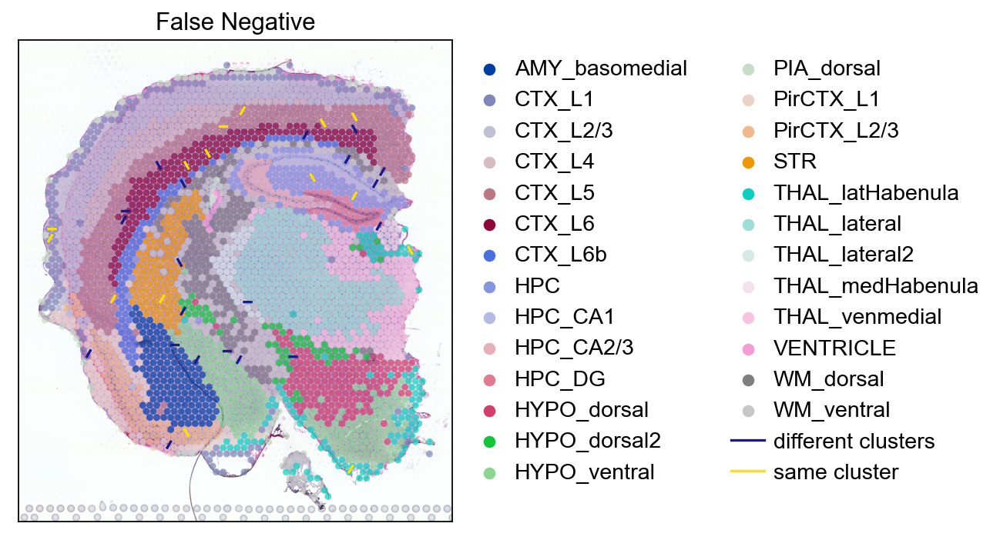

假负例中属于不同簇的点对占比为：57.1%


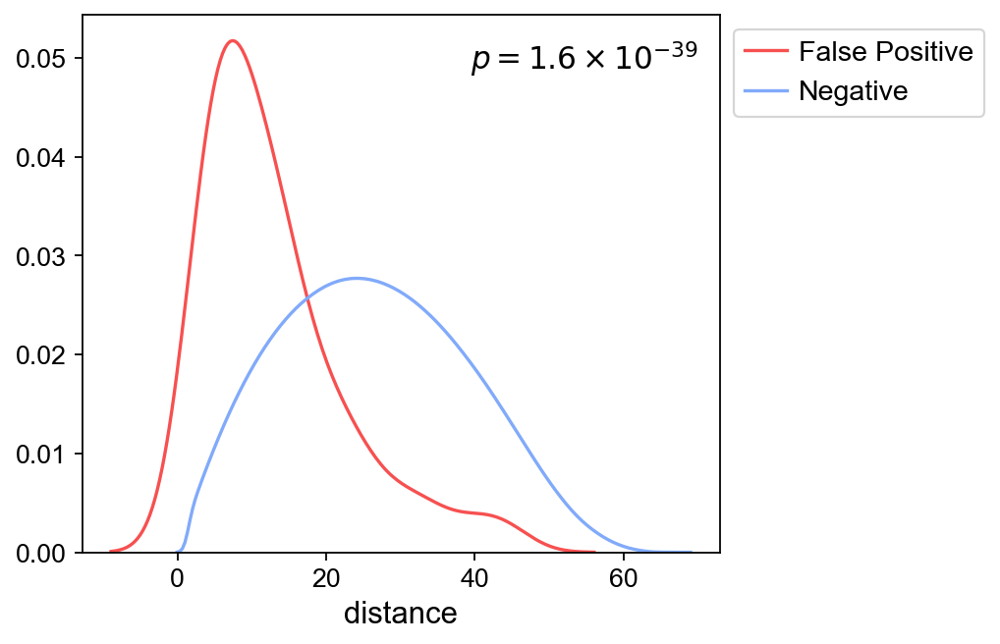

In [22]:
ratio = adata.uns["spatial"]['spaceranger100_count_30458_ST8059048_mm10-3_0_0_premrna']["scalefactors"]["tissue_hires_scalef"] 
eval.advance(pred_nn, test_label, test_index, adata, ratio, distance, neighbor_dis = NEIGHBOR_DIS,
             dirname = dirname)

不同群之间邻近的预测情况

In [23]:
result, _, is_diff = eval.edge_evaluate(test_label, pred_nn, predprob_nn, test_index, adata.obs["clusters"].copy())
result

{'Accuracy': 0.9506369426751592,
 'AUC': 0.9832300702189178,
 'Precision': 0.7723076923076924,
 'Recall': 0.9296296296296296,
 'MCC': 0.8196217505641201,
 'F1_Score': 0.8436974789915966,
 'confusion_matrix': array([[1540,   74],
        [  19,  251]], dtype=int64)}

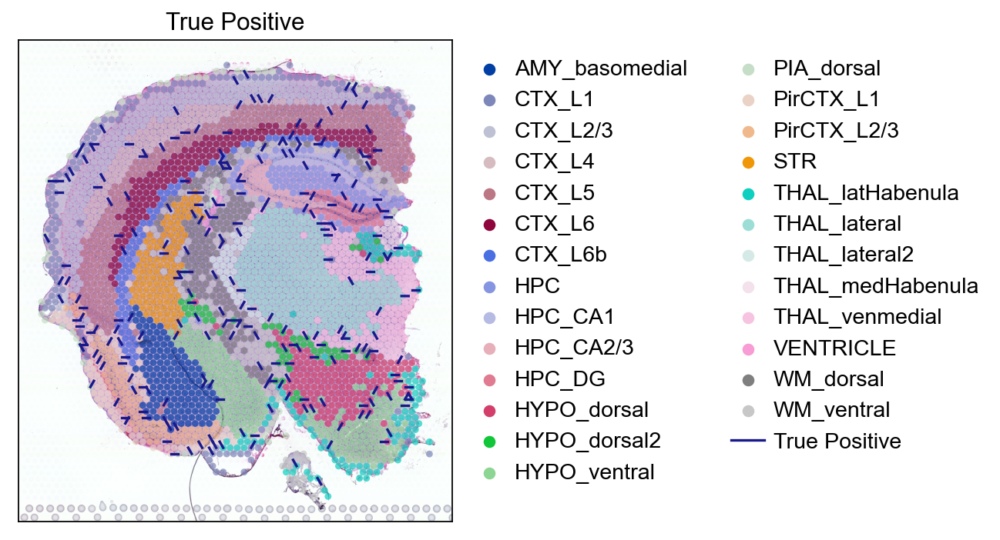

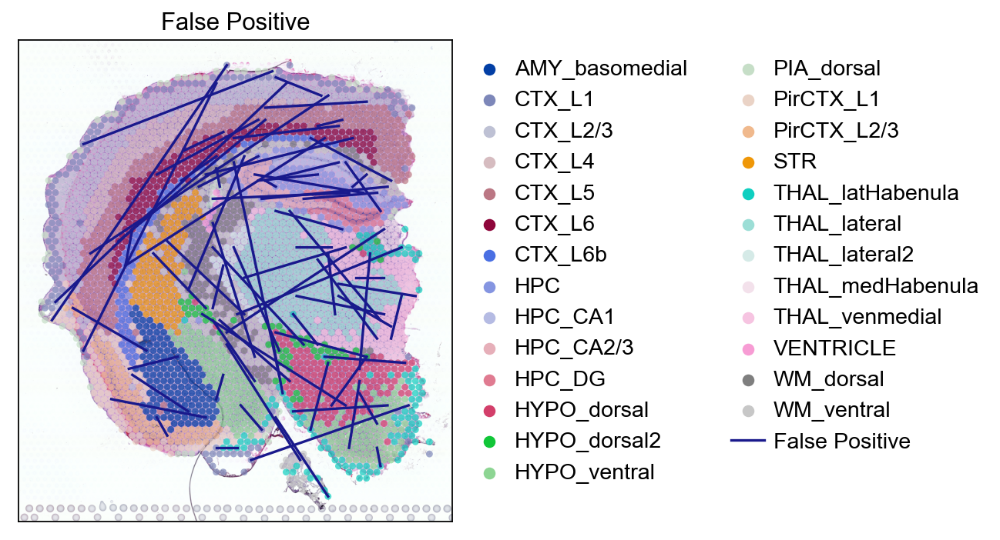

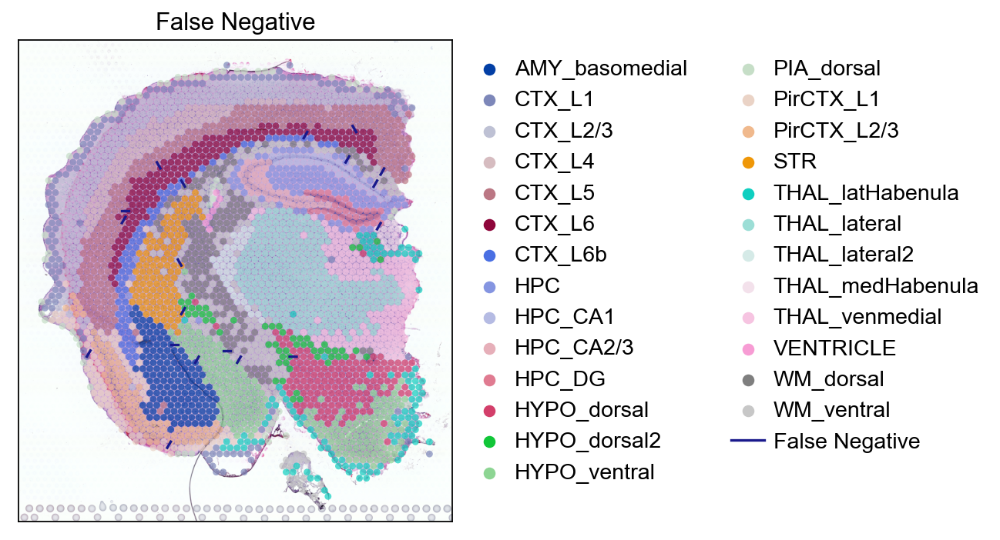

In [24]:
eval.edge_advance(is_diff, pred_nn, test_label, test_index, adata, ratio, dirname = dirname)

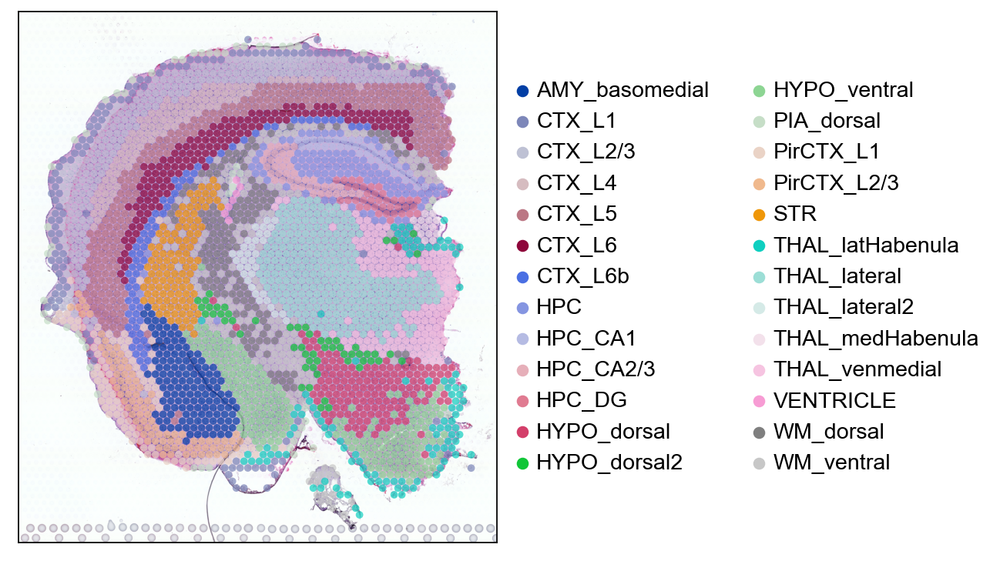

In [25]:
import matplotlib.pyplot as plt
_, ax = plt.subplots(constrained_layout = True, figsize = (8, 6))
sc.pl.spatial(adata, img_key = "hires", size = 1.5, alpha = 0.7, color = "clusters", title = "", show = False, ax = ax)
plt.xlabel("")
plt.ylabel("")
plt.savefig(dirname + "/HEimage.svg", bbox_inches = 'tight')

In [26]:
import pickle
with open(dirname + "/data.pkl", "wb") as file:
    pickle.dump(nnmodel, file)

In [27]:
adata.var["gene_ids"].to_csv(dirname + "/adata.txt", sep = "\t")